In [1]:
import os, sys
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *
from mitequinox.sigp import *

In [2]:
from dask_jobqueue import PBSCluster
# for heavy processing:
cluster = PBSCluster(cores=6, processes=6, walltime='03:30:00')
w = cluster.scale(6*2)

In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.135.36.230:32953 Dashboard: /user/yux/proxy/8787/status,Cluster Workers: 12 Cores: 12 Memory: 200.04 GB


____________
# Global maps of total, geo, ageo uv (snapshots)

In [5]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150

In [6]:
#grd = load_grd().drop(['hFacC','hFacW','hFacS','rA','rAw','rAs'])
dij = 4
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij))

grd = load_grd().reset_coords().isel(i=slice(0,None,dij), j=slice(0,None,dij))
mask = ((grd.hFacW.rename({'i_g': 'i'}) == 1) &
        (grd.hFacS.rename({'j_g': 'j'}) == 1) 
       ).rename('mask').reset_coords(drop=True)
grd_rspec = xr.merge([grd.XC, grd.YC, grd.Depth, grd.CS, grd.SN])

## Eta

In [7]:
# define (real) time
def iters_to_date(iters, delta_t=3600.):
    t0 = datetime.datetime(2011,11,23,8)    
    ltime = delta_t * (np.array(iters))
    dtime = [t0+dateutil.relativedelta.relativedelta(seconds=t) for t in ltime]    
    return dtime

time_day = iters_to_date(np.arange(40))

In [8]:
# Eta
E_dir = '/work/ALT/swot/aval/syn/xy/momentum_balance/daily/'
grd = load_grd().drop(['hFacC','hFacW','hFacS','rA','rAw','rAs'])
dsE = xr.open_zarr(root_data_dir+'zarr/%s.zarr'%('Eta')).isel(time=slice(1512+200,1512+240))
dsE = xr.merge([dsE,grd])
dsE = dsE.assign_coords(time=time_day) 
dsE = dsE.isel(i=slice(0,None,dij), j=slice(0,None,dij))

In [11]:
import cartopy.feature as cfeature
font_size = 32

def plot_pretty(v, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                offline=False, figsize=(20,12), cmmap='thermal', coast_resolution='110m',
                ignore_face=[]):
    
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=0))
        cmap = getattr(cm, cmmap)
        gen = (face for face in v.face.values if face not in ignore_face)
        for face in gen:
            vplt = v.sel(face=face)
            if face in [6,7,8,9]:
                # this deals with dateline crossing areas
                im = vplt.where( (vplt.XC<=179.9) & (vplt.XC>=0.)).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
                im = vplt.where( (vplt.XC>-179.9) & (vplt.XC<=0) ).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            else:
                im = vplt.plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)              
                
        cax = plt.axes([0.925, 0.25, 0.025, 0.5])
        cb = plt.colorbar(im, cax=cax, ticks=[-4, -3, -2, -1, 0, 1, 2, 3, 4])
        #cb.ax.set_yticklabels(['10$^{-2}$','10$^{-1}$','10$^0$'])
        cb.ax.tick_params(labelsize=font_size)
        ax.set_title('',fontsize=font_size)
        ax.set_xticks([-180, -135, -90, -45, 0, 45,  90, 135, 180])
        ax.set_xticklabels(['$180\degree$W','$135\degree$W','$90\degree$W','$45\degree$W','$0\degree$','$45\degree$E','$90\degree$E','$135\degree$E','$180\degree$E'])
        ax.set_ylim(-70., 70.)
        ax.set_yticks([-70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70])
        ax.set_yticklabels(['','$60\degree$S','','$40\degree$S','','$20\degree$S','','$0\degree$','','$20\degree$N','','$40\degree$N','','$60\degree$N',''])
        ax.tick_params(direction='out', length=6, width=2)
        ax.set_ylabel('',fontsize=font_size)
        ax.set_xlabel('',fontsize=font_size)
        ax.tick_params(labelsize=font_size)

        if coast_resolution is not None:
            ax.coastlines(resolution=coast_resolution, color='k')
        ax.add_feature(cfeature.LAND)        
        
        if title is not None:
            ax.set_title(title)
        if label is not None:
            cb.set_label(label=label, size=font_size)     #
        if savefig is not None:
            fig.savefig(savefig, dpi=150)
            plt.close(fig)
        #
        if not offline:
            plt.show()

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically incr

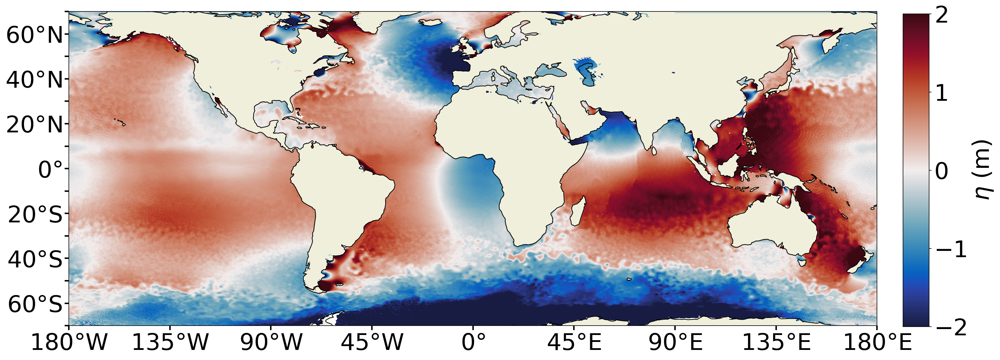

In [13]:
plot_pretty(dsE.Eta.sel(time='2011-11-24T08:00:00'), label='$\eta$ (m)', vmin = -2, vmax=2, cmmap='balance', ignore_face=[6])

/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,
/home/uz/yux/.conda/envs/equinox/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically incr

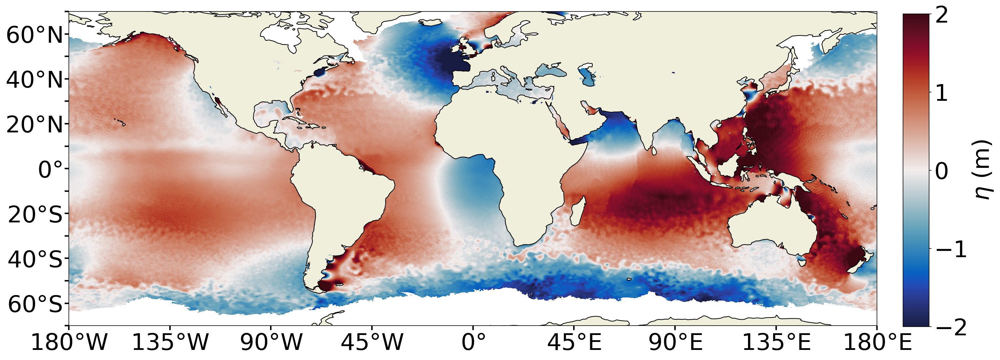

In [14]:
plot_pretty(dsE.Eta.sel(time='2011-11-24T08:00:00').where(ice>0), label='$\eta$ (m)', vmin = -2, vmax=2, cmmap='balance', ignore_face=[6])

## UV

In [121]:
# define (real) time
def iters_to_date(iters, delta_t=3600.):
    t0 = datetime.datetime(2011,11,23,8)    
    ltime = delta_t * (np.array(iters))
    dtime = [t0+dateutil.relativedelta.relativedelta(seconds=t) for t in ltime]    
    return dtime

time_day = iters_to_date(np.arange(40))

In [122]:
# u
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/comparison/u_f%02d.zarr'%(face)) for face in face_all] 
ds_u_all = xr.concat(D, dim='face').isel(time=slice(200,240))
ds_u_all = ds_u_all.assign_coords(time=time_day) 

In [123]:
# v
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/comparison/v_f%02d.zarr'%(face)) for face in face_all] 
ds_v_all = xr.concat(D, dim='face').isel(time=slice(200,240))
ds_v_all = ds_v_all.assign_coords(time=time_day) 

In [124]:
# takes about 10 mins
# rotate coordinate
u_ageo = ds_u_all.u_ageo.sel(time='2011-11-24T08:00:00')*grd_rspec.CS - ds_v_all.v_ageo.sel(time='2011-11-24T08:00:00')*grd_rspec.SN
#v_ageo = ds_u_all.u_ageo.sel(time='2011-11-24T08:00:00')*grd_rspec.SN + ds_v_all.v_ageo.sel(time='2011-11-24T08:00:00')*grd_rspec.CS

#u_geo = ds_u_all.u_geo.sel(time='2011-11-24T08:00:00')*grd_rspec.CS - ds_v_all.v_geo.sel(time='2011-11-24T08:00:00')*grd_rspec.SN
#v_geo = ds_u_all.u_geo.sel(time='2011-11-24T08:00:00')*grd_rspec.SN + ds_v_all.v_geo.sel(time='2011-11-24T08:00:00')*grd_rspec.CS

#u = ds_u_all.u.sel(time='2011-11-24T08:00:00')*grd_rspec.CS - ds_v_all.v.sel(time='2011-11-24T08:00:00')*grd_rspec.SN
#v = ds_u_all.u.sel(time='2011-11-24T08:00:00')*grd_rspec.SN + ds_v_all.v.sel(time='2011-11-24T08:00:00')*grd_rspec.CS

In [125]:
font_size = 32

def plot_pretty(v, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                offline=False, figsize=(20,12), cmmap='thermal',
                ignore_face=[]):
    
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
        cmap = getattr(cm, cmmap)
        gen = (face for face in v.face.values if face not in ignore_face)
        for face in gen:
            vplt = v.sel(face=face)
            if face in [6,7,8,9]:
                # this deals with dateline crossing areas
                im = vplt.where( (vplt.XC>=0) & (vplt.XC<=180.)).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
                im = vplt.where(vplt.XC<=0).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            if face in [11,12]:
                # this deals with dateline crossing areas
                im = vplt.where(vplt.j!=40).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)     
            else:
                im = vplt.plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
                
        cax = plt.axes([0.925, 0.25, 0.025, 0.5])
        cb = plt.colorbar(im, cax=cax, ticks=[-2, -1, 0, 1, 2])
        #cb.ax.set_yticklabels(['10$^{-2}$','10$^{-1}$','10$^0$'])
        cb.ax.tick_params(labelsize=font_size)
        ax.set_title('',fontsize=font_size)
        ax.set_xticks([-180, -135, -90, -45, 0, 45,  90, 135, 180])
        ax.set_xticklabels(['$180\degree$W','$135\degree$W','$90\degree$W','$45\degree$W','$0\degree$','$45\degree$E','$90\degree$E','$135\degree$E','$180\degree$E'])
        ax.set_ylim(-70., 70.)
        #ax.set_yticks([-60, -40, -20, 0, 20, 40, 60])
        #ax.set_yticklabels(['$60\degree$S','$40\degree$S','$20\degree$S','$0\degree$','$20\degree$N','$40\degree$N','$60\degree$N'])
        
        ax.set_yticks([-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60])
        ax.set_yticklabels(['$60\degree$S','','$40\degree$S','','$20\degree$S','','$0\degree$','','$20\degree$N','','$40\degree$N','','$60\degree$N'])
        
        ax.tick_params(direction='out', length=6, width=2)
        ax.set_ylabel('',fontsize=font_size)
        ax.set_xlabel('',fontsize=font_size)
        ax.tick_params(labelsize=font_size)
        if title is not None:
            ax.set_title(title)
        if label is not None:
            cb.set_label(label=label, size=font_size)     #
        if savefig is not None:
            fig.savefig(savefig, dpi=150)
            plt.close(fig)
        #
        if not offline:
            plt.show()
            

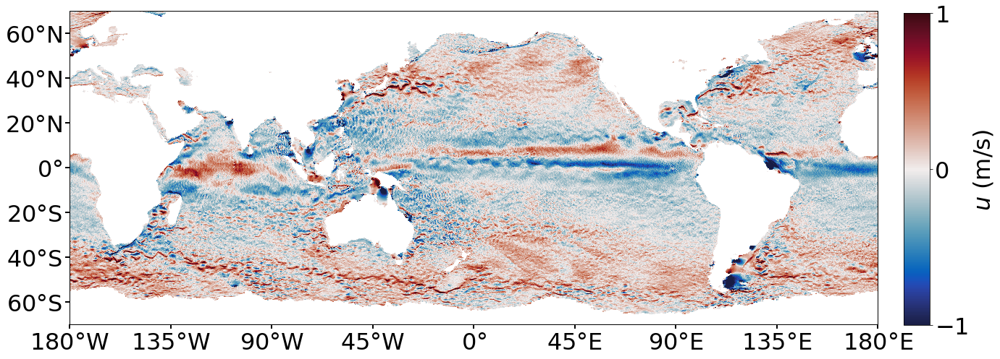

In [13]:
plot_pretty(u.where(ice>0), label='$u$ (m/s)', vmin = -1, vmax=1, cmmap='balance', ignore_face=[6])

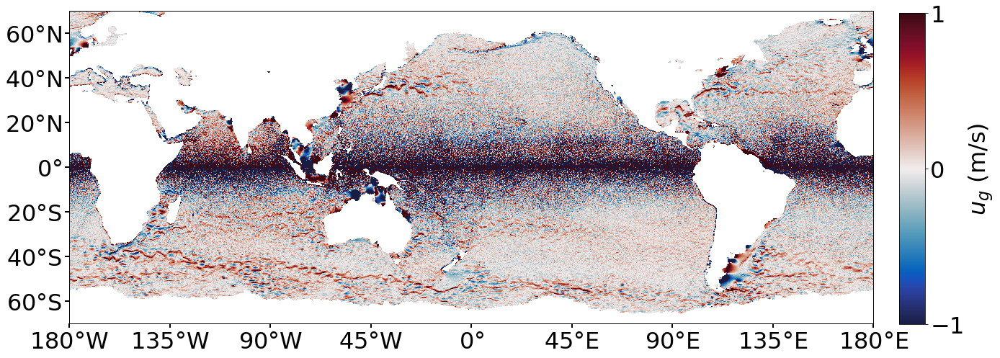

In [11]:
plot_pretty(u_geo.isel(i=slice(1,-1),j=slice(1,-1)).where(ice>0), label='$u_g$ (m/s)', vmin = -1, vmax=1, cmmap='balance', ignore_face=[6])

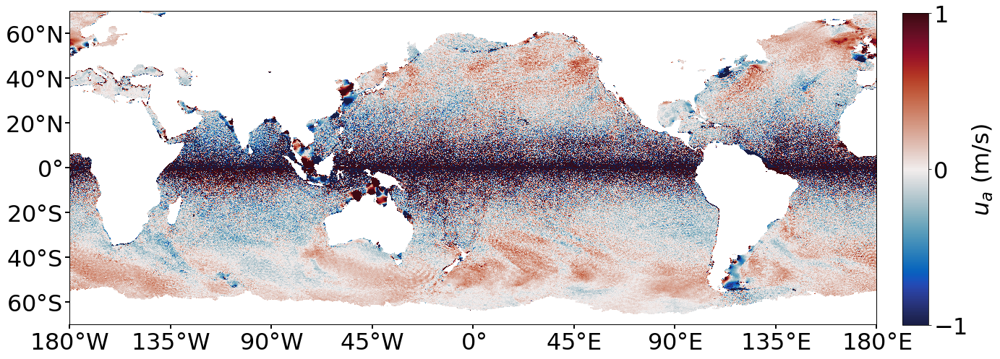

In [12]:
plot_pretty(u_ageo.isel(i=slice(1,-1),j=slice(1,-1)).where(ice>0), label='$u_a$ (m/s)', vmin = -1, vmax=1, cmmap='balance', ignore_face=[6])

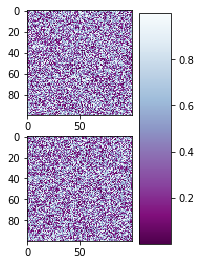

In [69]:
np.random.seed(19680801)


plt.subplot(211)
plt.imshow(np.random.random((100, 100)), cmap=plt.cm.BuPu_r)
plt.subplot(212)
plt.imshow(np.random.random((100, 100)), cmap=plt.cm.BuPu_r)

plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.6, 0.09, 0.075, 0.8])
plt.colorbar(cax=cax)
plt.show()

# Simple plots

In [47]:
# define (real) time
def iters_to_date(iters, delta_t=3600.):
    t0 = datetime.datetime(2011,11,23,8)    
    ltime = delta_t * (np.array(iters))
    dtime = [t0+dateutil.relativedelta.relativedelta(seconds=t) for t in ltime]    
    return dtime

time_day = iters_to_date(np.arange(4000))

In [48]:
# Eta
E_dir = '/work/ALT/swot/aval/syn/xy/momentum_balance/daily/'
grd = load_grd().drop(['hFacC','hFacW','hFacS','rA','rAw','rAs'])
dsE = xr.open_zarr(root_data_dir+'zarr/%s.zarr'%('Eta')).isel(time=slice(1512+200,1512+4200))
dsE = xr.merge([dsE,grd])
dsE = dsE.assign_coords(time=time_day) 
dsE = dsE.isel(i=slice(0,None,dij), j=slice(0,None,dij))
dsE

<xarray.Dataset>
Dimensions:  (face: 13, i: 1080, i_g: 4320, j: 1080, j_g: 4320, k: 90, k_l: 90, k_p1: 91, k_u: 90, time: 4000)
Coordinates:
    dtime    (time) datetime64[ns] dask.array<chunksize=(4000,), meta=np.ndarray>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    iters    (time) int64 dask.array<chunksize=(1,), meta=np.ndarray>
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * time     (time) datetime64[ns] 2011-11-23T08:00:00 ... 2012-05-07T23:00:00
    CS       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    PHrefC   (k) float32 dask.array<chunksize=(90,), meta=np.ndarray>
    PHrefF   (k_p1) float32 dask.array<chunksize=(91,), meta=np.ndarray>
    SN       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
   

In [85]:
font_size = 32

def plot_pretty(v, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                offline=False, figsize=(20,12), cmmap='thermal',
                ignore_face=[]):
    
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
        cmap = getattr(cm, cmmap)
        gen = (face for face in v.face.values if face not in ignore_face)
        for face in gen:
            vplt = v.sel(face=face)
            if face in [6,7,8,9]:
                # this deals with dateline crossing areas
                im = vplt.where( (vplt.XC>=0) & (vplt.XC<=180.)).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
                im = vplt.where(vplt.XC<=0).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            else:
                im = vplt.plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
                
        cax = plt.axes([0.925, 0.25, 0.025, 0.5])
        cb = plt.colorbar(im, cax=cax, ticks=[-4, -3, -2, -1, 0, 1, 2, 3, 4])
        #cb.ax.set_yticklabels(['10$^{-2}$','10$^{-1}$','10$^0$'])
        cb.ax.tick_params(labelsize=font_size)
        ax.set_title('',fontsize=font_size)
        ax.set_xticks([-180, -135, -90, -45, 0, 45,  90, 135, 180])
        ax.set_xticklabels(['$180\degree$W','$135\degree$W','$90\degree$W','$45\degree$W','$0\degree$','$45\degree$E','$90\degree$E','$135\degree$E','$180\degree$E'])
        ax.set_ylim(-70., 70.)
        ax.set_yticks([-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60])
        ax.set_yticklabels(['$60\degree$S','','$40\degree$S','','$20\degree$S','','$0\degree$','','$20\degree$N','','$40\degree$N','','$60\degree$N'])
        ax.tick_params(direction='out', length=6, width=2)
        ax.set_ylabel('',fontsize=font_size)
        ax.set_xlabel('',fontsize=font_size)
        ax.tick_params(labelsize=font_size)
        if title is not None:
            ax.set_title(title)
        if label is not None:
            cb.set_label(label=label, size=font_size)     #
        if savefig is not None:
            fig.savefig(savefig, dpi=150)
            plt.close(fig)
        #
        if not offline:
            plt.show()
            

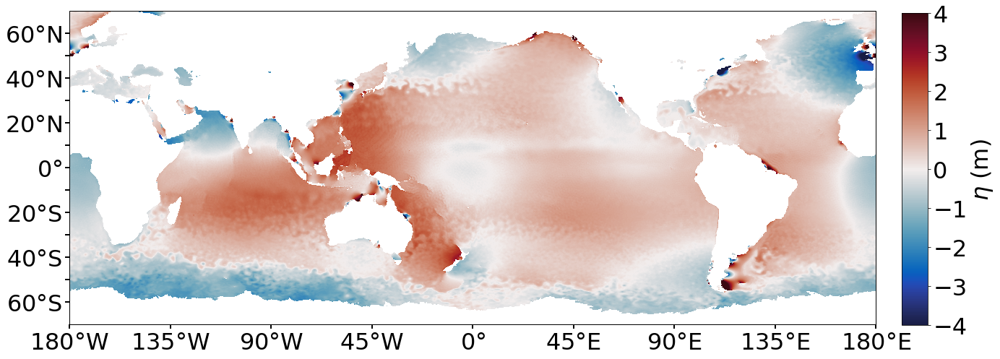

In [86]:
plot_pretty(dsE.Eta.sel(time='2011-11-24T08:00:00').where(ice>0), label='$\eta$ (m)', vmin = -4, vmax=4, cmmap='balance', ignore_face=[6])

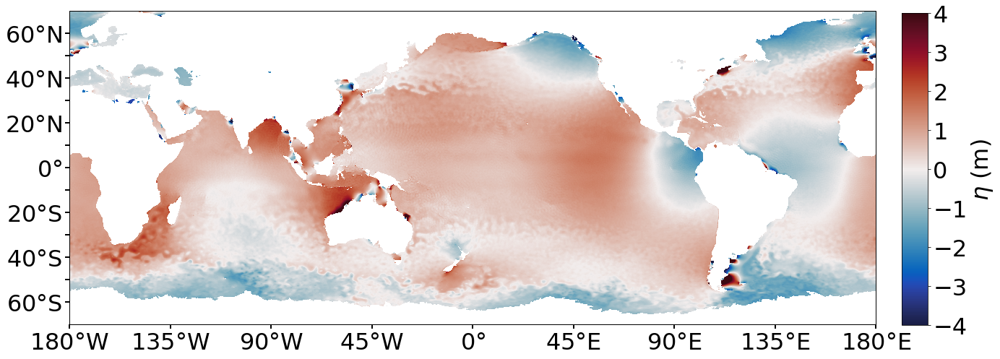

In [87]:
plot_pretty(dsE.Eta.sel(time='2012-02-10T15:00:00').where(ice>0), label='$\eta$ (m)', vmin = -4, vmax=4, cmmap='balance', ignore_face=[6])

Text(0.5, 0, '')

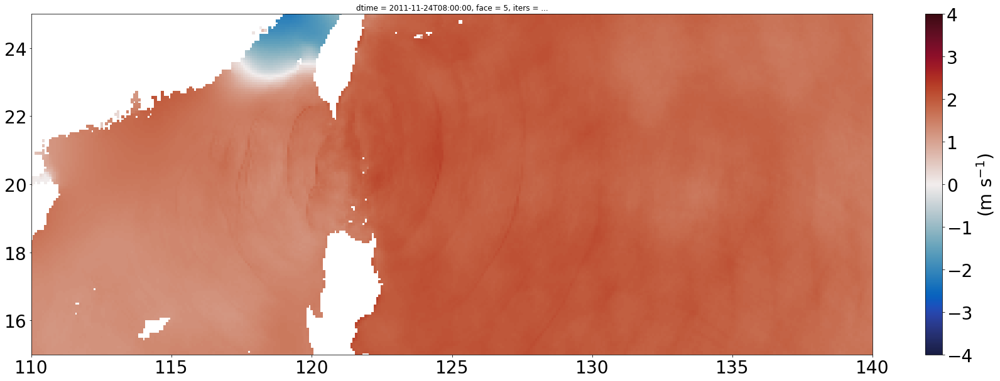

In [81]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=dsE.Eta.sel(time='2011-11-24T08:00:00').where(ice>0).isel(face=5, i=slice(600,1080), j=slice(0,500)).plot(x='XC', y='YC', vmin=-4,vmax=4.,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(110., 140.)
ax.set_ylim(15., 25.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

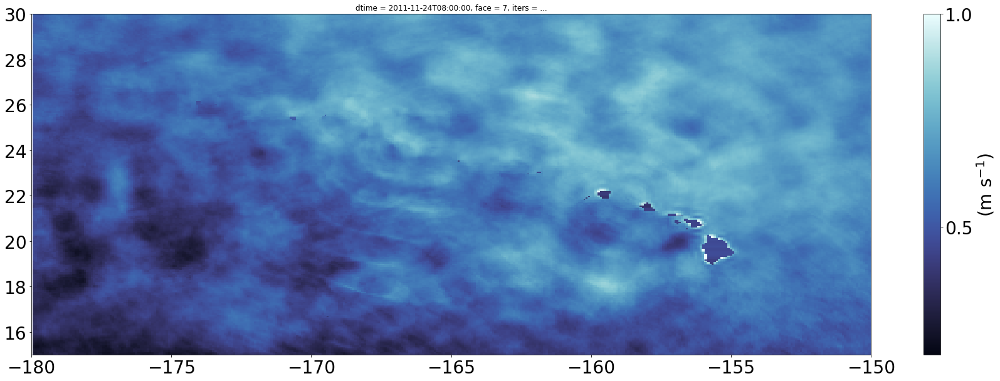

In [116]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=dsE.Eta.sel(time='2011-11-24T08:00:00').where(ice>0).isel(face=7).plot(x='XC', y='YC', vmin=0.2,vmax=1,cmap=cm.ice, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical', ticks=[-1, -0.5, 0, 0.5, 1])
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(-180., -150.)
ax.set_ylim(15., 30.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

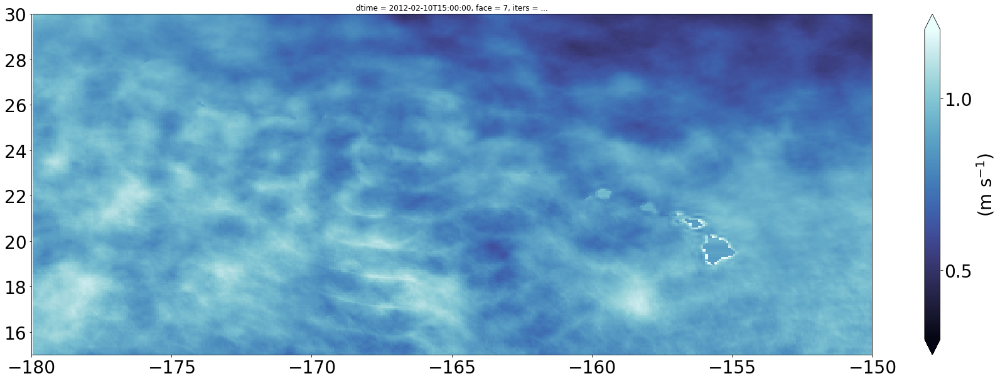

In [120]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=dsE.Eta.sel(time='2012-02-10T15:00:00').where(ice>0).isel(face=7).plot(x='XC', y='YC', vmin=0.3,vmax=1.2,cmap=cm.ice, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical', ticks=[-1, -0.5, 0, 0.5, 1])
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(-180., -150.)
ax.set_ylim(15., 30.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

# Save a snapshot first

In [18]:
# u, geo_u, ageo_u
time = '2011-11-24T08:00:00'

dij=4
overwrite=True
    
for face in range(13):
#for face in [1]:

    Efile = work_data_dir+'xy/comparison/snapshot/uv_snapshot_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        E = xr.merge([ds_u_all.u_ageo.sel(time=time, face=face), ds_u_all.u_geo.sel(time=time, face=face), ds_u_all.u.sel(time=time, face=face),
                      ds_v_all.v_ageo.sel(time=time, face=face), ds_v_all.v_geo.sel(time=time, face=face), ds_v_all.v.sel(time=time, face=face)])
        
        # store
        for c in E.coords:
            try:
                del E[c].encoding['chunks']
            except:
                print(c)

        E = E.chunk({'i': 1080, 'j':1080})
        %time E.to_zarr(Efile, mode='w')
        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

time
Depth
XC
YC
dxC
dxG
dyC
dyG
f_i
f_j
face
mask
CS
SN
CPU times: user 7.78 s, sys: 552 ms, total: 8.33 s
Wall time: 26.9 s
--- face 0 done
time
Depth
XC
YC
dxC
dxG
dyC
dyG
f_i
f_j
face
mask
CS
SN
CPU times: user 9.32 s, sys: 671 ms, total: 10 s
Wall time: 48.9 s
--- face 1 done
time
Depth
XC
YC
dxC
dxG
dyC
dyG
f_i
f_j
face
mask
CS
SN
CPU times: user 7.76 s, sys: 438 ms, total: 8.2 s
Wall time: 20.2 s
--- face 2 done
time
Depth
XC
YC
dxC
dxG
dyC
dyG
f_i
f_j
face
mask
CS
SN
CPU times: user 7.36 s, sys: 375 ms, total: 7.74 s
Wall time: 14.8 s
--- face 3 done
time
Depth
XC
YC
dxC
dxG
dyC
dyG
f_i
f_j
face
mask
CS
SN
CPU times: user 9.17 s, sys: 616 ms, total: 9.79 s
Wall time: 48.6 s
--- face 4 done
time
Depth
XC
YC
dxC
dxG
dyC
dyG
f_i
f_j
face
mask
CS
SN
CPU times: user 7.37 s, sys: 377 ms, total: 7.75 s
Wall time: 12.2 s
--- face 5 done
time
Depth
XC
YC
dxC
dxG
dyC
dyG
f_i
f_j
face
mask
CS
SN
CPU times: user 8.09 s, sys: 565 ms, total: 8.65 s
Wall time: 19.1 s
--- face 6 done
time
Dept

In [6]:
# uv
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/comparison/snapshot/uv_snapshot_f%02d.zarr'%(face)) for face in face_all] 
ds = xr.concat(D, dim='face')
ds

<xarray.Dataset>
Dimensions:  (face: 13, i: 1080, j: 1080)
Coordinates:
    time     datetime64[ns] 2011-11-24T08:00:00
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    CS       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    SN       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    YC       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxC      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxG      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyC      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyG 

In [7]:
#grd = load_grd().drop(['hFacC','hFacW','hFacS','rA','rAw','rAs'])
dij = 4
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij))

grd = load_grd().reset_coords().isel(i=slice(0,None,dij), j=slice(0,None,dij))
mask = ((grd.hFacW.rename({'i_g': 'i'}) == 1) &
        (grd.hFacS.rename({'j_g': 'j'}) == 1) 
       ).rename('mask').reset_coords(drop=True)
grd_rspec = xr.merge([grd.XC, grd.YC, grd.Depth, grd.CS, grd.SN])

In [8]:
# takes about 10 mins
# rotate coordinate

u_ageo = ds.u_ageo*grd_rspec.CS - ds.v_ageo*grd_rspec.SN
#v_ageo = ds.u_ageo*grd_rspec.SN + ds.v_ageo*grd_rspec.CS

u_geo = ds.u_geo*grd_rspec.CS - ds.v_geo*grd_rspec.SN
#v_geo = ds.u_geo*grd_rspec.SN + ds.v_geo*grd_rspec.CS

u = ds.u*grd_rspec.CS - ds.v*grd_rspec.SN
#v = ds.u*grd_rspec.SN + ds.v*grd_rspec.CS

In [9]:
font_size = 32

def plot_pretty(v, colorbar=False, title=None, label=None, vmin=None, vmax=None, savefig=None, 
                offline=False, figsize=(20,12), cmmap='thermal',
                ignore_face=[]):
    
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
        cmap = getattr(cm, cmmap)
        gen = (face for face in v.face.values if face not in ignore_face)
        for face in gen:
            vplt = v.sel(face=face)
            if face in [6,7,8,9]:
                # this deals with dateline crossing areas
                im = vplt.where( (vplt.XC>=0) & (vplt.XC<=180.)).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
                im = vplt.where(vplt.XC<=0).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            if face in [11,12]:
                # this deals with dateline crossing areas
                im = vplt.where(vplt.j!=40).plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)     
            else:
                im = vplt.plot.pcolormesh(ax=ax,                   
                                transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
                
        cax = plt.axes([0.925, 0.25, 0.025, 0.5])
        cb = plt.colorbar(im, cax=cax, ticks=[-2, -1, 0, 1, 2])
        #cb.ax.set_yticklabels(['10$^{-2}$','10$^{-1}$','10$^0$'])
        cb.ax.tick_params(labelsize=font_size)
        ax.set_title('',fontsize=font_size)
        ax.set_xticks([-180, -135, -90, -45, 0, 45,  90, 135, 180])
        ax.set_xticklabels(['$180\degree$W','$135\degree$W','$90\degree$W','$45\degree$W','$0\degree$','$45\degree$E','$90\degree$E','$135\degree$E','$180\degree$E'])
        ax.set_ylim(-70., 70.)
        ax.set_yticks([-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60])
        ax.set_yticklabels(['$60\degree$S','','$40\degree$S','','$20\degree$S','','$0\degree$','','$20\degree$N','','$40\degree$N','','$60\degree$N'])
        ax.tick_params(direction='out', length=6, width=2)
        ax.set_ylabel('',fontsize=font_size)
        ax.set_xlabel('',fontsize=font_size)
        ax.tick_params(labelsize=font_size)
        if title is not None:
            ax.set_title(title)
        if label is not None:
            cb.set_label(label=label, size=font_size)     #
        if savefig is not None:
            fig.savefig(savefig, dpi=None)
            plt.close(fig)
        #
        if not offline:
            plt.show()
            

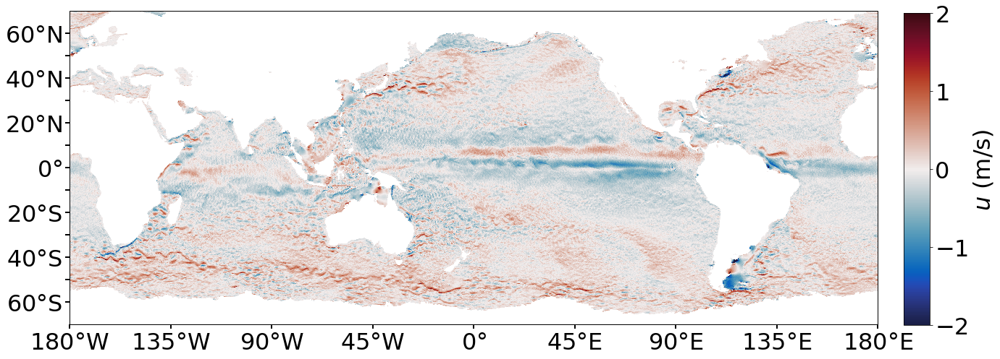

In [134]:
plot_pretty(u.where(ice>0), label='$u$ (m/s)', vmin = -2, vmax=2, cmmap='balance', ignore_face=[6])

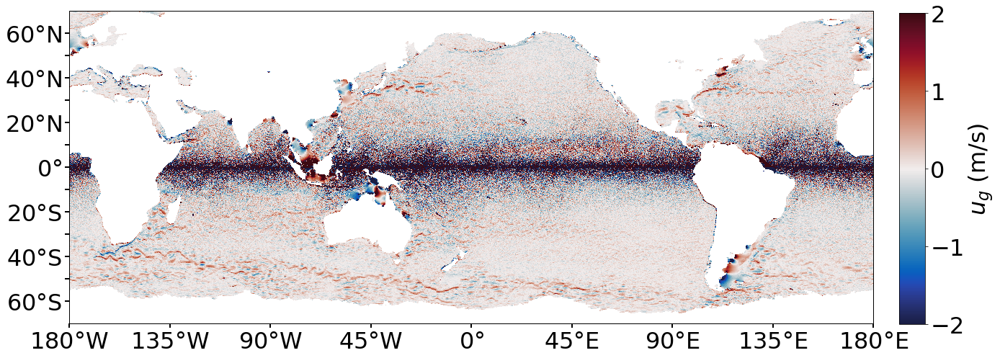

In [135]:
plot_pretty(u_geo.isel(i=slice(1,-1),j=slice(1,-1)).where(ice>0), label='$u_g$ (m/s)', vmin = -2, vmax=2, cmmap='balance', ignore_face=[6])

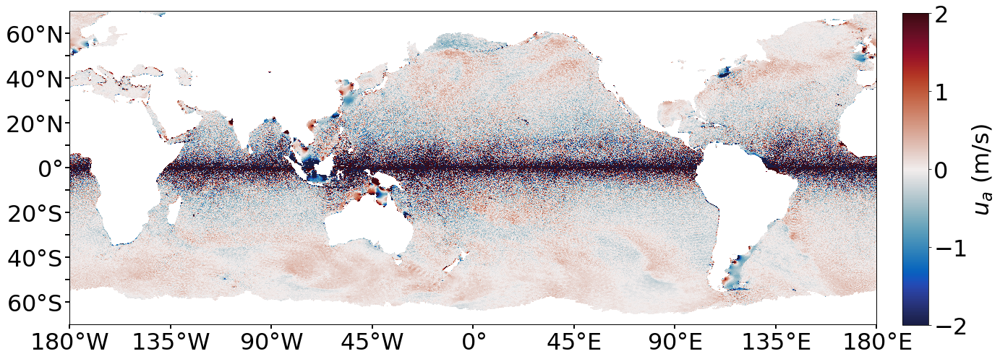

In [136]:
plot_pretty(u_ageo.isel(i=slice(1,-1),j=slice(1,-1)).where(ice>0), label='$u_a$ (m/s)', vmin = -2, vmax=2, cmmap='balance', ignore_face=[6])

Text(0.5, 0, '')

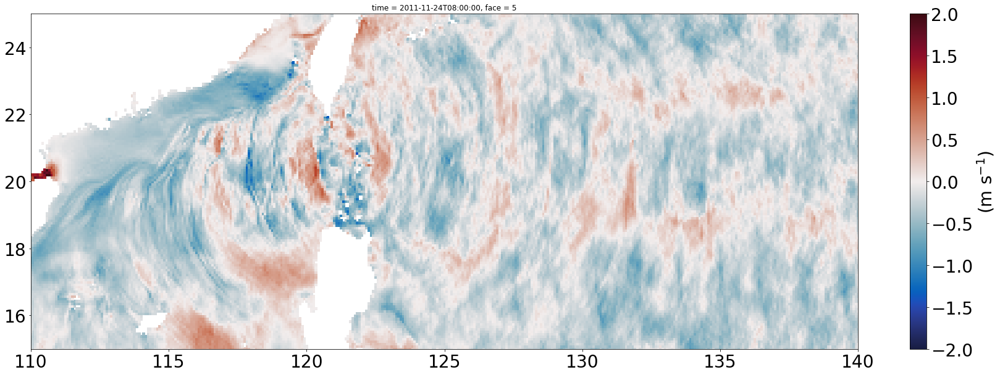

In [20]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=u.where(ice>0).isel(face=5, i=slice(600,1080), j=slice(0,800)).plot(x='XC', y='YC', vmin=-2,vmax=2.,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(110., 140.)
ax.set_ylim(15., 25.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

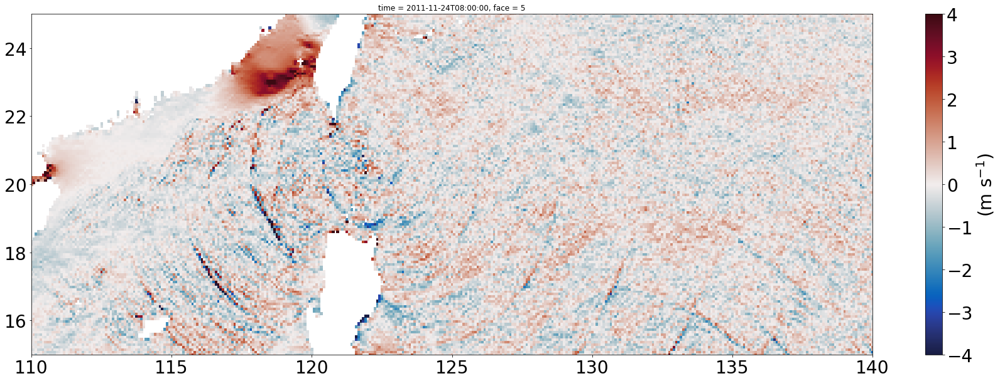

In [18]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=u_geo.where(ice>0).isel(face=5, i=slice(600,1080), j=slice(0,800)).plot(x='XC', y='YC', vmin=-4,vmax=4.,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(110., 140.)
ax.set_ylim(15., 25.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

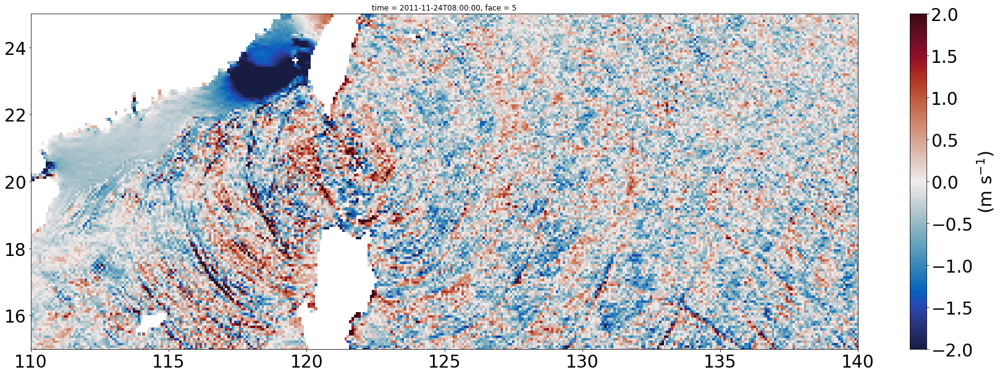

In [13]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=u_ageo.where(ice>0).isel(face=5, i=slice(600,1080), j=slice(0,500)).plot(x='XC', y='YC', vmin=-2,vmax=2.,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(110., 140.)
ax.set_ylim(15., 25.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

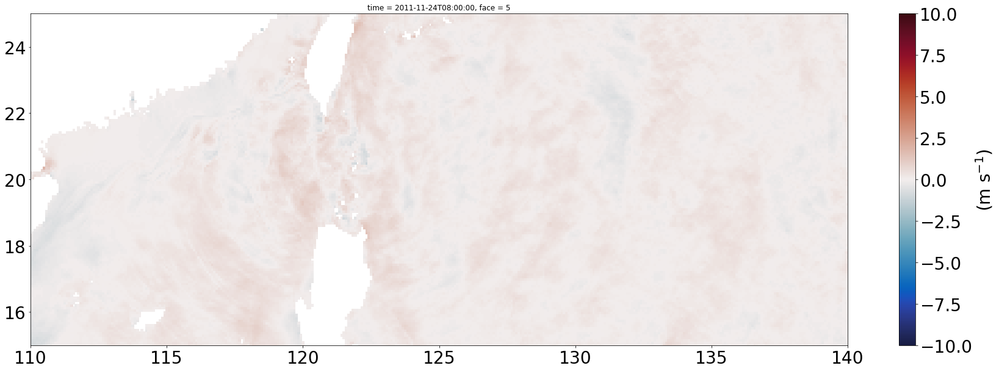

In [26]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=v.where(ice>0).isel(face=5, i=slice(600,1080), j=slice(0,500)).plot(x='XC', y='YC', vmin=-10,vmax=10.,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(110., 140.)
ax.set_ylim(15., 25.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

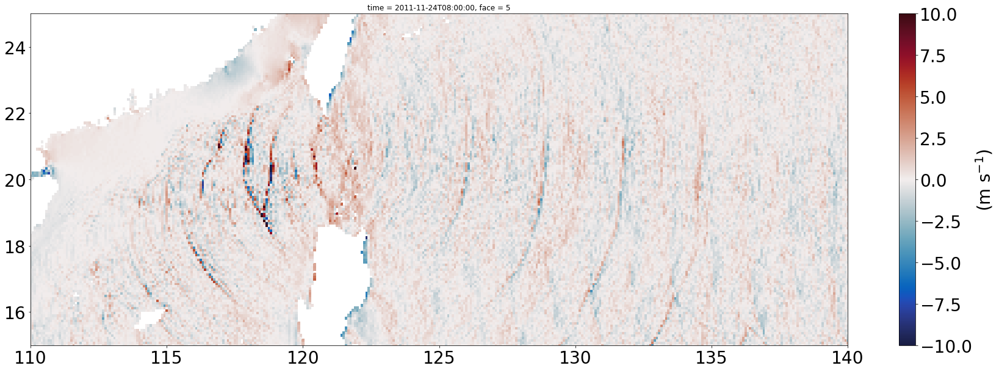

In [25]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=v_geo.where(ice>0).isel(face=5, i=slice(600,1080), j=slice(0,500)).plot(x='XC', y='YC', vmin=-10,vmax=10.,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(110., 140.)
ax.set_ylim(15., 25.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

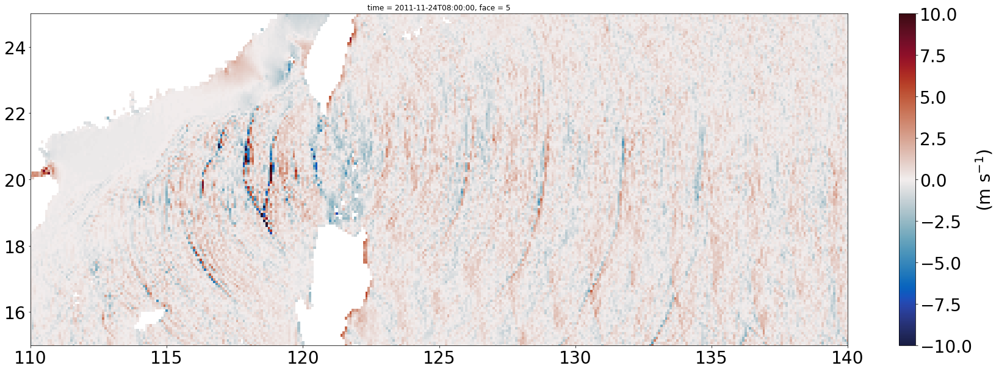

In [24]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=v_ageo.where(ice>0).isel(face=5, i=slice(600,1080), j=slice(0,500)).plot(x='XC', y='YC', vmin=-10,vmax=10.,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical')
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(110., 140.)
ax.set_ylim(15., 25.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

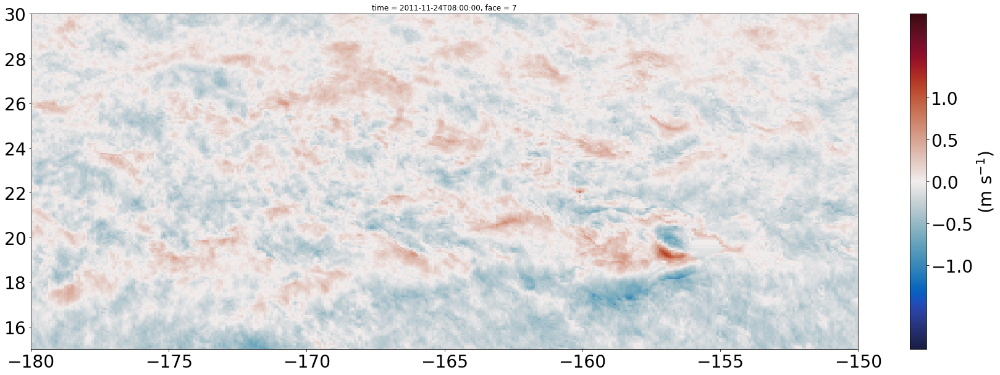

In [22]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=u.where(ice>0).isel(face=7).plot(x='XC', y='YC', vmin=-2,vmax=2,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical', ticks=[-1, -0.5, 0, 0.5, 1])
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(-180., -150.)
ax.set_ylim(15., 30.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

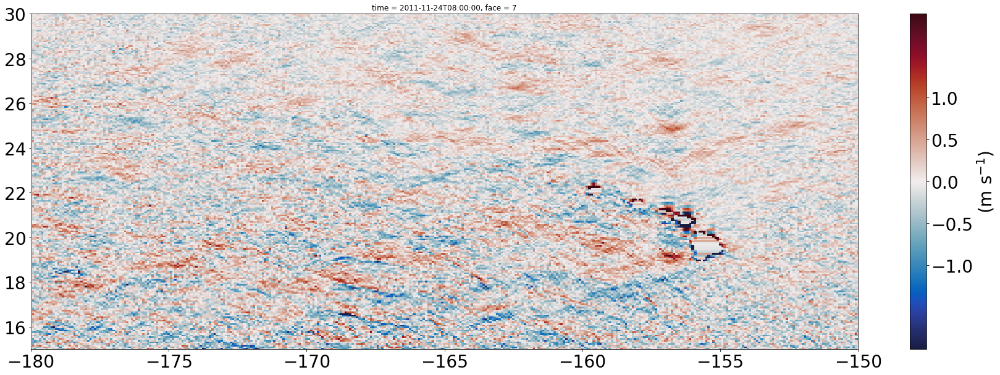

In [21]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=u_geo.where(ice>0).isel(face=7).plot(x='XC', y='YC', vmin=-2,vmax=2,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical', ticks=[-1, -0.5, 0, 0.5, 1])
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(-180., -150.)
ax.set_ylim(15., 30.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

Text(0.5, 0, '')

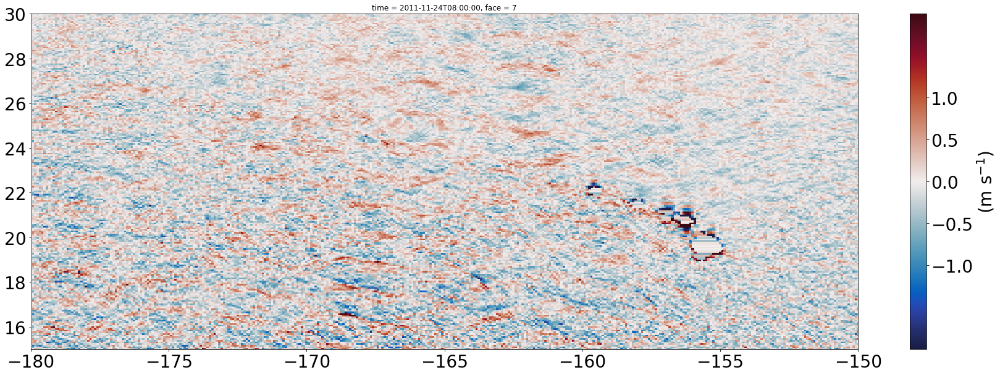

In [12]:
font_size =28
fig = plt.figure(figsize=(30,10))

ax = plt.subplot(111)
cax=u_ageo.where(ice>0).isel(face=7).plot(x='XC', y='YC', vmin=-2,vmax=2,cmap=cm.balance, add_colorbar = False)
cbar = plt.colorbar(cax, ax=ax, orientation='vertical', ticks=[-1, -0.5, 0, 0.5, 1])
#cbar.ax.set_yticklabels(['-4','-2','0','2','4'])
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('(m s$^{-1}$)', fontsize=font_size)
ax.tick_params(labelsize=font_size)
ax.set_xlim(-180., -150.)
ax.set_ylim(15., 30.)
ax.set_ylabel('',fontsize=font_size)
ax.set_xlabel('',fontsize=font_size)

In [ ]:
cluster.close()